In [1]:
import skimage as ski
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Dropout, LeakyReLU, Conv2DTranspose, Input, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model


# If GPU is available make the VRAM scalable
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [2]:
# Load the images and convert them to LUV
training_images = np.zeros((1921,256,256,3))
for idx, file in enumerate(os.listdir('landscape_1')):
    img = ski.io.imread('landscape_1/' + file)
    luv_img = ski.color.rgb2luv(img).reshape(1,256,256,3)
    training_images[idx] = luv_img
    
    print('Processed image', idx)

Processed image 0
Processed image 1
Processed image 2
Processed image 3
Processed image 4
Processed image 5
Processed image 6
Processed image 7
Processed image 8
Processed image 9
Processed image 10
Processed image 11
Processed image 12
Processed image 13
Processed image 14
Processed image 15
Processed image 16
Processed image 17
Processed image 18
Processed image 19
Processed image 20
Processed image 21
Processed image 22
Processed image 23
Processed image 24
Processed image 25
Processed image 26
Processed image 27
Processed image 28
Processed image 29
Processed image 30
Processed image 31
Processed image 32
Processed image 33
Processed image 34
Processed image 35
Processed image 36
Processed image 37
Processed image 38
Processed image 39
Processed image 40
Processed image 41
Processed image 42
Processed image 43
Processed image 44
Processed image 45
Processed image 46
Processed image 47
Processed image 48
Processed image 49
Processed image 50
Processed image 51
Processed image 52
Pro

In [3]:
# Scale the LUV channels using StandardScaler

l_channel = training_images[:,:,:,0]
u_channel = training_images[:,:,:,1]
v_channel = training_images[:,:,:,2]

l_scaler = StandardScaler()
u_scaler = StandardScaler()
v_scaler = StandardScaler()

l_channel = l_scaler.fit_transform(l_channel.reshape(-1,1)).reshape(-1,256,256)
u_channel = u_scaler.fit_transform(u_channel.reshape(-1,1)).reshape(-1,256,256)
v_channel = v_scaler.fit_transform(v_channel.reshape(-1,1)).reshape(-1,256,256)

In [4]:
class Autencoder:

    def __init__(self, load_path :str = None):
        """
        Initialize the model

        Args:
            load_path (str, optional): Path to a saved model. Defaults to None.
        """
        if load_path:
            self.load(load_path)
        else:
            self.model = self.build_model()
    
    def build_model(self):
        """
        Build the autoencoder model
        """
        model = Sequential()
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 1)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2, 2), padding='same'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
        model.add(Dropout(0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2, 2), padding='same'))
        model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2, 2), padding='same'))
        model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
        model.add(BatchNormalization())
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
        model.add(Dropout(0.2))
        model.add(BatchNormalization())
        model.add(UpSampling2D((2, 2)))
        model.add(Conv2D(2, (3, 3), padding='same'))


        model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
        model.summary()

        self.model = model
    
    def fit(self, X : np.ndarray, y : np.ndarray, epochs: int =30, batch_size: int =16, save: bool = False, save_path : str = None):
        """
        Train the model and save if needed

        Args:
            X (np.ndarray): Training data images with L channel
            y (np.ndarray): Training data images with U and V channels 
            epochs (int, optional): Number of epochs. Defaults to 30.
            batch_size (int, optional): The batch size. Defaults to 16.
            save (bool, optional): If to save the model. Defaults to False.
            save_path (str, optional): The path to save the model to. Defaults to None.
        """
        self.model.fit(
            X, y, 
            epochs=epochs, 
            batch_size=batch_size,
            shuffle=True
        )
        if save:
            self.save(save_path)

    def predict(self, X : np.ndarray) -> np.ndarray:
        """
        Predict the colours based oi the L channel

        Args:
            X (np.ndarray): The L channel images

        Returns:
            np.ndarray: The predicted U and V channels
        """
        return self.model.predict(X)
    
    def save(self, path : str):
        """
        Save the model

        Args:
            path (str): path to save the model
        """
        self.model.save(path)
    
    def load(self, path : str):
        """
        Load a model

        Args:
            path (str): Path to the model
        """
        self.model = tf.keras.models.load_model(path)

In [5]:
autoencoder = Autencoder('models/colorization_model.h5')
autoencoder.model.summary()

c:\Users\sebas\anaconda3\envs\uda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\sebas\anaconda3\envs\uda\Lib\site-packages\keras\src\optimizers\base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 2)    │           578 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 760,228 (2.90 MB)

 Trainable params: 758,882 (2.89 MB)

 Non-trainable params: 1,344 (5.25 KB)

 Optimizer params: 2 (12.00 B)

In [6]:
class Unet:

    def __init__(self, load_path : str = None):
        """
        Initialize the model

        Args:
            load_path (str, optional): Path to a saved model. Defaults to None.
        """
        if load_path:
            self.load(load_path)
        else:
            self.model = self.build_model()
        
    def build_model(self):
        """
        Build the U-Net model
        """

        input_layer = Input(shape=(256, 256, 1))
        unet_layer = Conv2D(128, (3, 3), padding='same', input_shape=(256, 256, 1),kernel_initializer='he_normal')(input_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        c1 = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal',name='c1')(unet_layer)
        unet_layer = BatchNormalization()(c1)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = MaxPooling2D((2, 2), padding='same')(unet_layer)
        unet_layer = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        c2 = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal',name='c2')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = MaxPooling2D((2, 2), padding='same')(unet_layer)
        unet_layer = Conv2D(512, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(512, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(512, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2DTranspose(256, (2, 2), strides=2, padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU(name='leaky1')(unet_layer)
        unet_layer = Concatenate(axis=3)([unet_layer, c2])
        unet_layer = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2DTranspose(128, (2, 2), strides=2, padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU(name='leaky2')(unet_layer)
        unet_layer = Concatenate(axis=3)([unet_layer, c1])
        unet_layer = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        unet_layer = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(unet_layer)
        unet_layer = BatchNormalization()(unet_layer)
        unet_layer = LeakyReLU()(unet_layer)
        output = Conv2D(2, (3, 3), padding='same')(unet_layer)

        unet = Model(inputs=input_layer, outputs=output)
        unet.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
        unet.summary()

        self.model = unet

    def fit(self, X : np.ndarray, y : np.ndarray, epochs: int =30, batch_size: int =4, save : bool = False, save_path : str = None):
        """
        Train the model and save if needed

        Args:
            X (np.ndarray): Training data images with L channel
            y (np.ndarray): Training data images with U and V channels 
            epochs (int, optional): Number of epochs. Defaults to 30.
            batch_size (int, optional): The batch size. Defaults to 4.
            save (bool, optional): If to save the model. Defaults to False.
            save_path (str, optional): The path to save the model to. Defaults to None.
        """
        self.model.fit(
            X, y, 
            epochs=epochs, 
            batch_size=batch_size,
            shuffle=True
        )
        if save:
            self.save(save_path)

    def predict(self, X : np.ndarray) -> np.ndarray:
        """
        Predict the colours based oi the L channel

        Args:
            X (np.ndarray): The L channel images

        Returns:
            np.ndarray: The predicted U and V channels
        """
        return self.model.predict(X)
    
    def save(self, path : str):
        """
        Save the model

        Args:
            path (str): path to save the model
        """
        self.model.save(path)

    def load(self, path : str):
        """
        Load a model

        Args:
            path (str): Path to the model
        """
        self.model = tf.keras.models.load_model(path)

In [7]:
unet = Unet()
unet.model.summary()
unet.fit(
    l_channel.reshape(-1,256,256,1),
    np.stack([u_channel, v_channel], axis=-1).reshape(-1,256,256,2),
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,280 │ input_layer[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │    147,584 │ leaky_re_lu[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ c1 (Conv2D)         │ (None, 256, 256,  │    147,584 │ leaky_re_lu_1[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ c1[0][0]          │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ leaky_re_lu_2[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │    295,168 │ max_pooling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    590,080 │ leaky_re_lu_3[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 11,296,772 (43.09 MB)

 Trainable params: 11,288,322 (43.06 MB)

 Non-trainable params: 8,448 (33.00 KB)

 Optimizer params: 2 (12.00 B)

In [8]:
def display_image(
    model : Model, image_idx : int, l_channel : np.ndarray, u_channel : np.ndarray, v_channel : np.ndarray, l_scaler : StandardScaler, u_scaler : StandardScaler, v_scaler : StandardScaler
):
    """
    Display the image with the predicted and real U and V channels

    Args:
        model (Model): Model to predict the U and V channels
        image_idx (int): Index of the image to display
        l_channel (np.ndarray): The L channel of the images
        u_channel (np.ndarray): The U channel of the images
        v_channel (np.ndarray): The V channel of the images
        l_scaler (StandardScaler): The L channel scaler
        u_scaler (StandardScaler): The U channel scaler
        v_scaler (StandardScaler): The V channel scaler
    """

    u_pred = model.predict(l_channel[image_idx,:,:].reshape(-1,256,256,1))

    pred_l_channel = l_scaler.inverse_transform(l_channel[image_idx,:,:].reshape(-1,1)).reshape(256,256,1)
    pred_u_channel = u_scaler.inverse_transform(u_pred[0,:,:,0].reshape(-1,1)).reshape(256,256,1)
    pred_v_channel = v_scaler.inverse_transform(u_pred[0,:,:,1].reshape(-1,1)).reshape(256,256,1)

    real_u_channel = u_scaler.inverse_transform(u_channel[image_idx,:,:].reshape(-1,1)).reshape(256,256,1) 
    real_v_channel = v_scaler.inverse_transform(v_channel[image_idx,:,:].reshape(-1,1)).reshape(256,256,1)

    plt.imshow(pred_l_channel, cmap='gray')
    plt.show()

    pred_luv_image = np.concatenate((pred_l_channel, pred_u_channel, pred_v_channel), axis=2)
    pred_rgb_image = ski.color.luv2rgb(pred_luv_image)
    plt.imshow(pred_rgb_image)
    plt.show()

    combined_real_image = np.concatenate((pred_l_channel, real_u_channel, real_v_channel), axis=2)

    plt.imshow(ski.color.luv2rgb(combined_real_image).reshape(256,256,3))
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


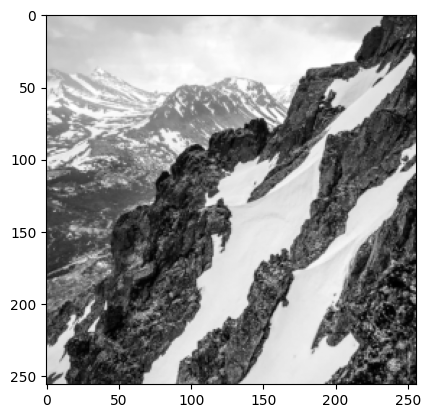

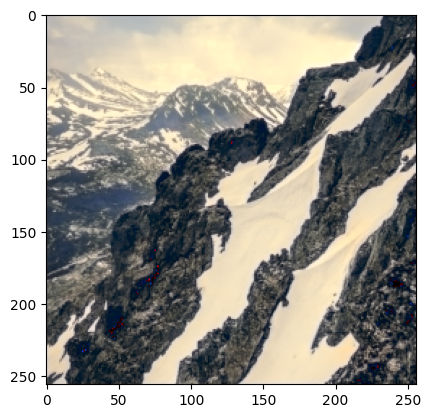

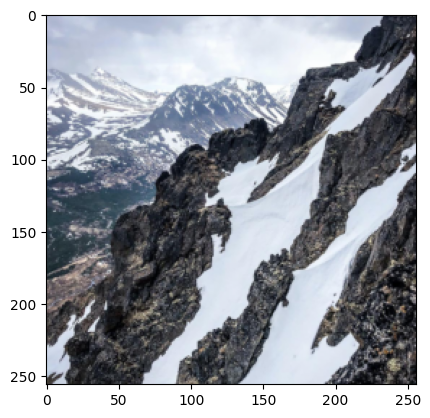

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


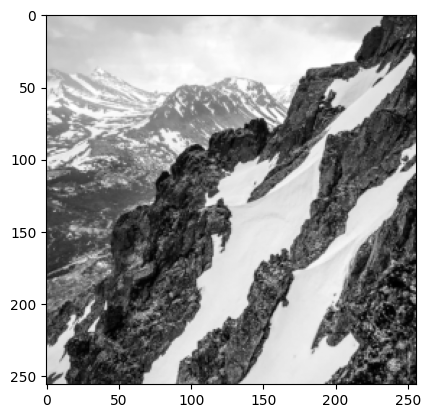

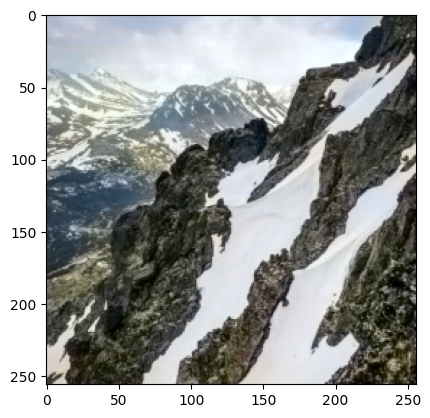

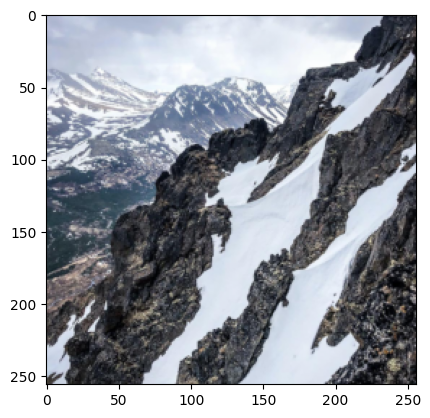

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


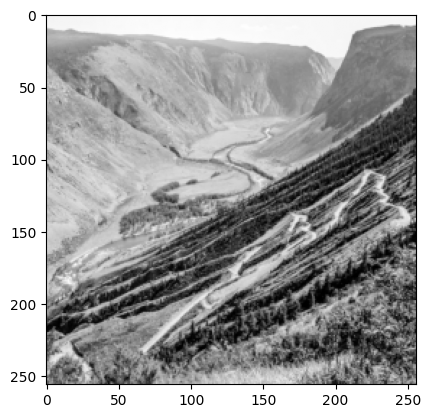

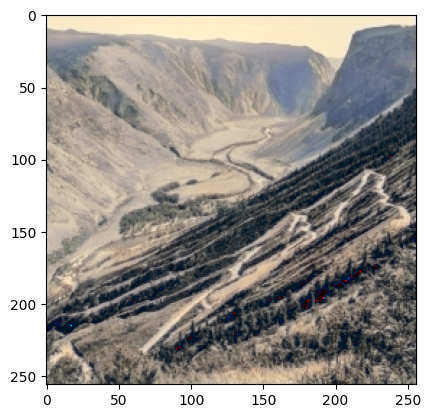

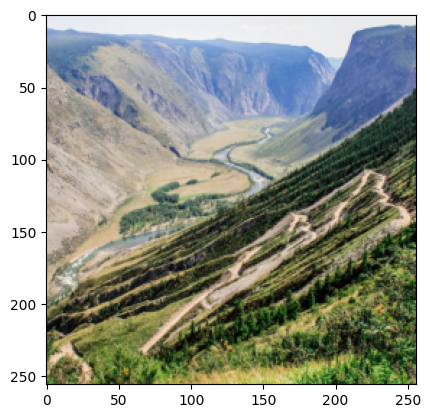

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


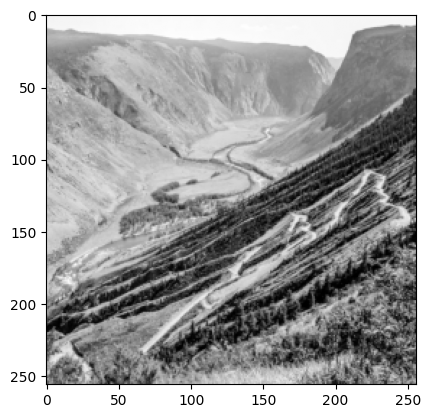

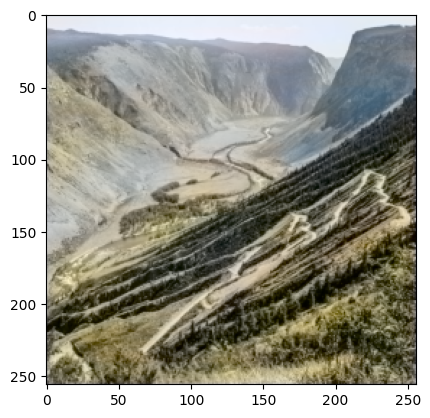

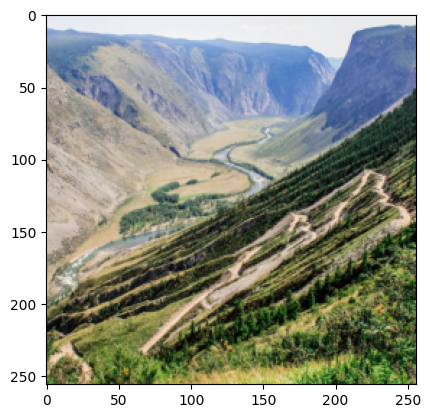

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


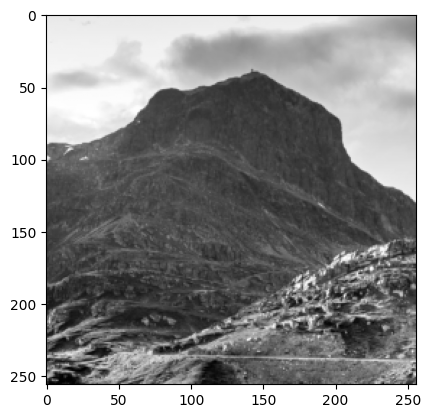

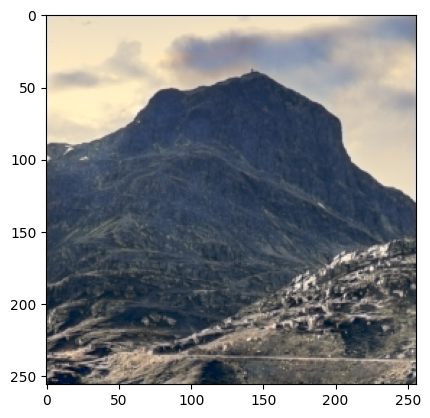

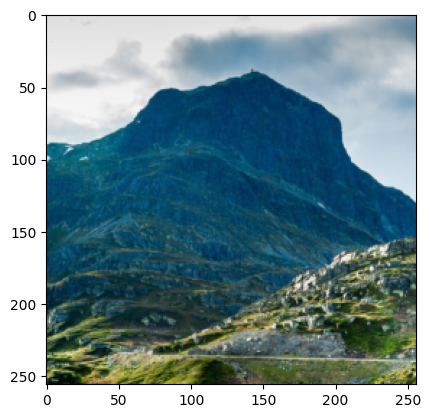

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


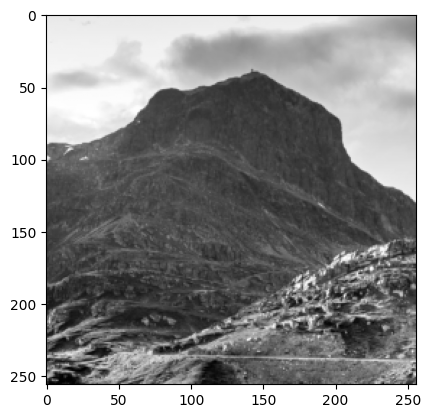

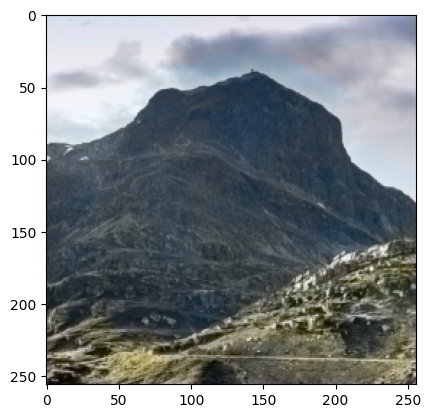

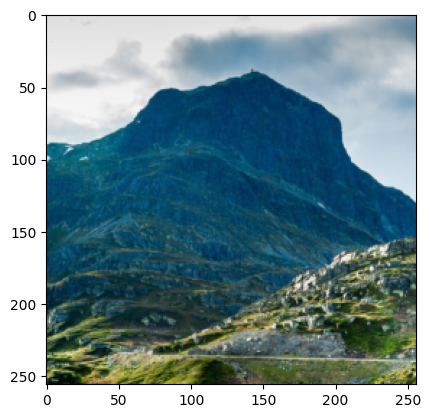

In [9]:
display_image(unet, 0, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)
display_image(autoencoder, 0, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)

display_image(unet, 100, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)
display_image(autoencoder, 100, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)

display_image(unet, 1000, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)
display_image(autoencoder, 1000, l_channel, u_channel, v_channel, l_scaler, u_scaler, v_scaler)

In [43]:
def analyse_model_performance(
    model : Model, l_channel : np.ndarray, u_channel : np.ndarray, v_channel : np.ndarray, u_scaler : StandardScaler, v_scaler : StandardScaler
):
    """
    Analyse the performance of the model using Mean Absolute Error

    Args:
        model (Model): The model to analyse
        l_channel (np.ndarray): The L channel of the images
        u_channel (np.ndarray): The U channel of the images
        v_channel (np.ndarray): The V channel of the images
        u_scaler (StandardScaler): The U channel scaler
        v_scaler (StandardScaler): THe V channel scaler
    """
    
    predicted_channels = model.predict(l_channel.reshape(-1,256,256,1))

    pred_u_channel = u_scaler.inverse_transform(predicted_channels[:,:,:,0].reshape(-1,1)).reshape(-1,256,256,1)
    pred_v_channel = v_scaler.inverse_transform(predicted_channels[:,:,:,1].reshape(-1,1)).reshape(-1,256,256,1)

    real_u_channel = u_scaler.inverse_transform(u_channel.reshape(-1,1)).reshape(-1,256,256,1)
    real_v_channel = v_scaler.inverse_transform(v_channel.reshape(-1,1)).reshape(-1,256,256,1)

    pred_u_channel = pred_u_channel[real_u_channel != 0]
    pred_v_channel = pred_v_channel[real_v_channel != 0]
    real_u_channel = real_u_channel[real_u_channel != 0]
    real_v_channel = real_v_channel[real_v_channel != 0]

    mean_absolute_error_u = np.mean(np.abs(real_u_channel - pred_u_channel))
    mean_absolute_error_v = np.mean(np.abs(real_v_channel - pred_v_channel))

    print('Mean absolute error for U channel:', mean_absolute_error_u)
    print('Mean absolute error for V channel:', mean_absolute_error_v)

analyse_model_performance(unet, l_channel, u_channel, v_channel, u_scaler, v_scaler)
analyse_model_performance(autoencoder, l_channel, u_channel, v_channel, u_scaler, v_scaler)

61/61 ━━━━━━━━━━━━━━━━━━━━ 1106s 18s/step
Mean absolute error for U channel: 12.34798757984445
Mean absolute error for V channel: 20.289738254747537
61/61 ━━━━━━━━━━━━━━━━━━━━ 39s 638ms/step
Mean absolute error for U channel: 9.575981776464275
Mean absolute error for V channel: 14.741747444351098


In [6]:
testing_images = np.zeros((10,256,256,3))
for idx, file in enumerate(os.listdir('black-and-white-resize')):
    img = ski.io.imread('black-and-white-resize/' + file)
    luv_img = ski.color.rgb2luv(img).reshape(1,256,256,3)
    testing_images[idx] = luv_img
    
    print('Processed image', idx)

(256, 256, 3)
Processed image 0
(256, 256, 3)
Processed image 1
(256, 256, 3)
Processed image 2
(256, 256, 3)
Processed image 3
(256, 256, 3)
Processed image 4
(256, 256, 3)
Processed image 5
(256, 256, 3)
Processed image 6
(256, 256, 3)
Processed image 7
(256, 256, 3)
Processed image 8
(256, 256, 3)
Processed image 9


In [16]:
l_channel_test = testing_images[:,:,:,0]
u_channel_test= testing_images[:,:,:,1]
v_channel_test = testing_images[:,:,:,2]

l_channel_test = l_scaler.transform(l_channel_test.reshape(-1,1)).reshape(-1,256,256)
u_channel_test = u_scaler.transform(u_channel_test.reshape(-1,1)).reshape(-1,256,256)
v_channel_test = v_scaler.transform(v_channel_test.reshape(-1,1)).reshape(-1,256,256)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


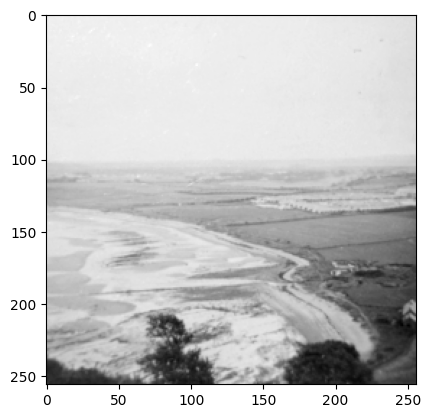

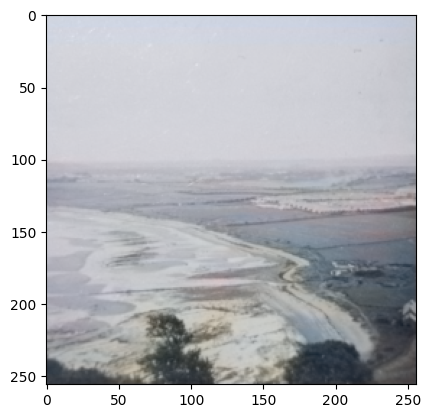

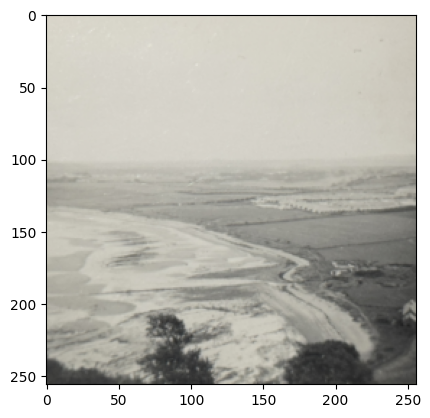

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


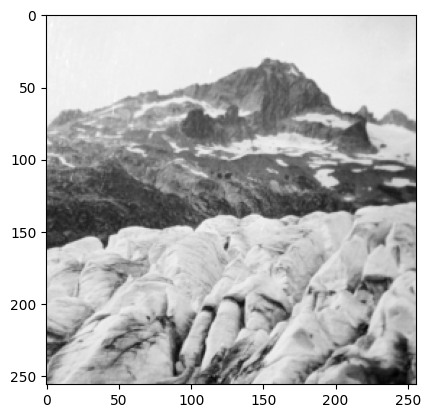

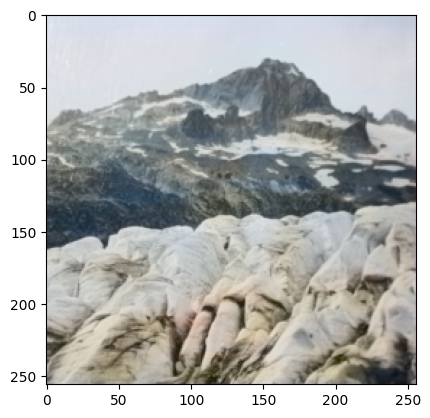

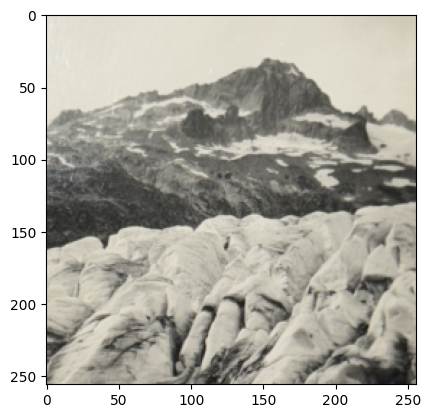

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


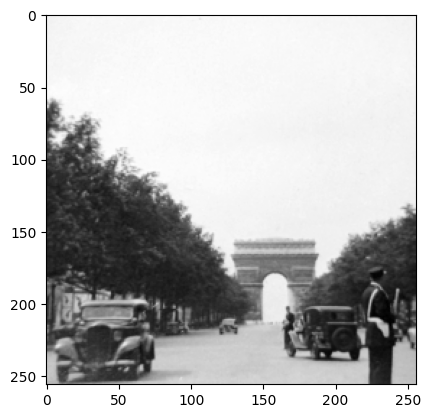

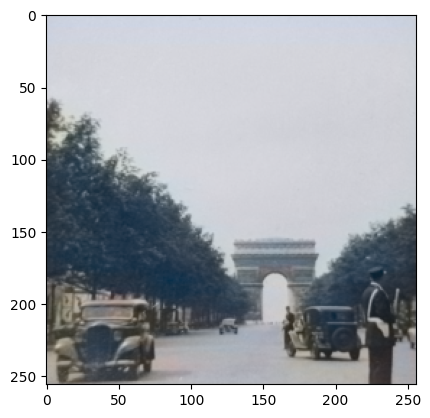

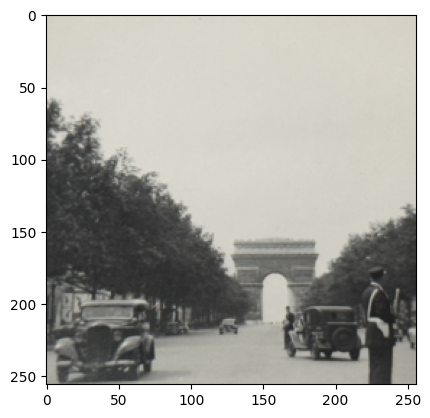

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


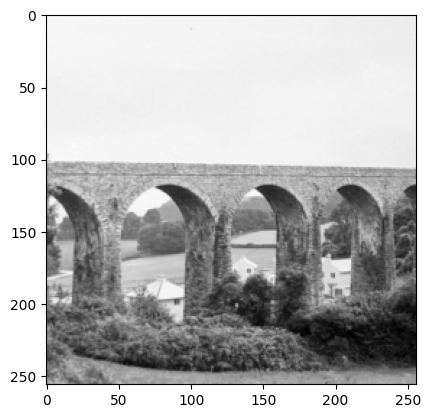

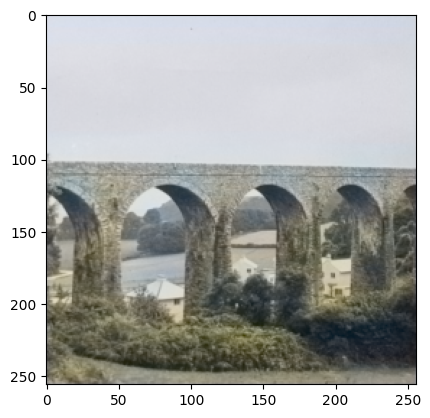

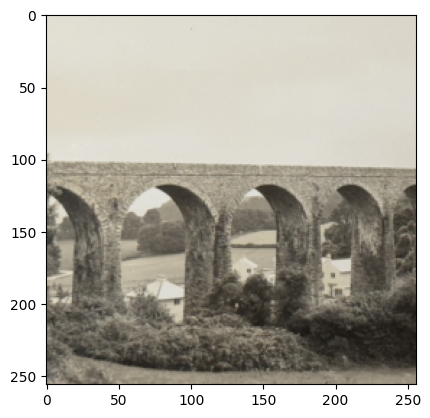

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


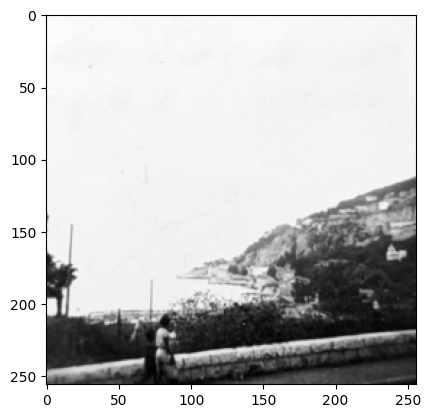

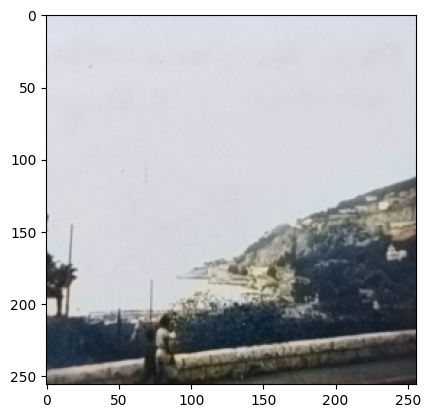

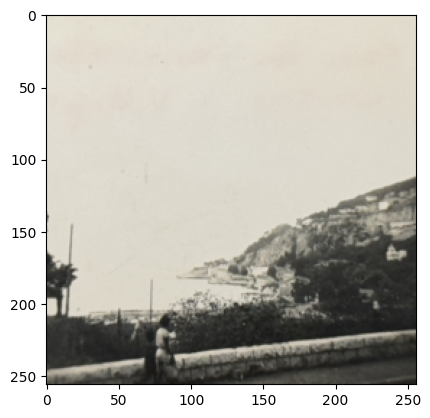

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


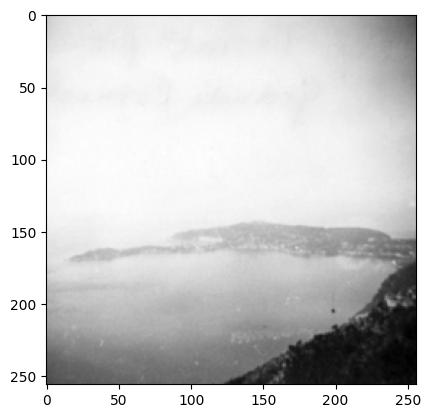

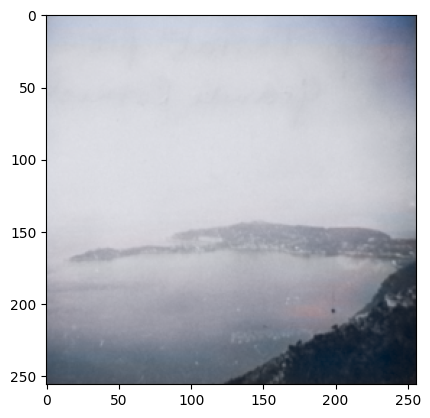

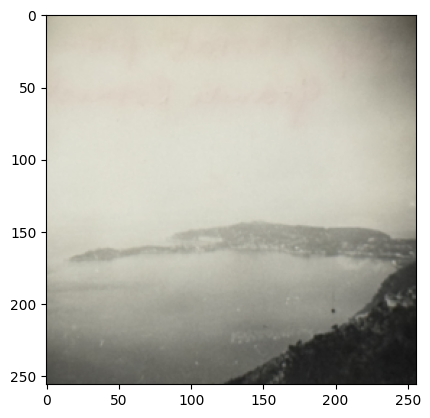

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


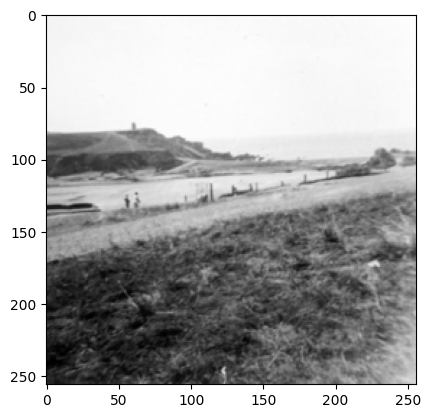

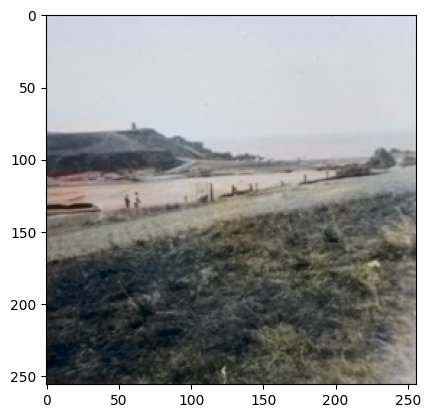

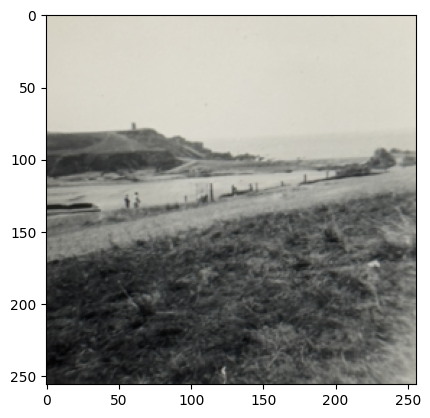

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


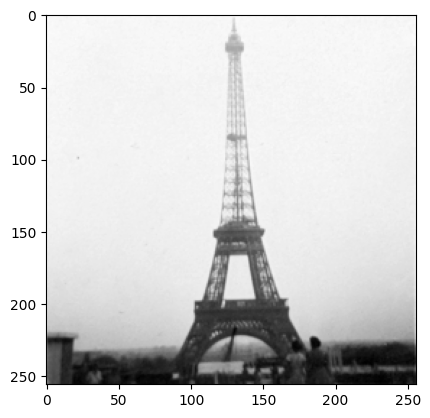

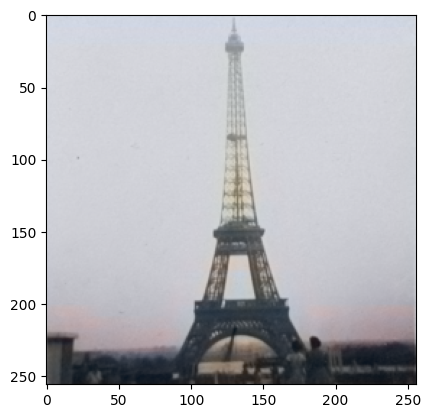

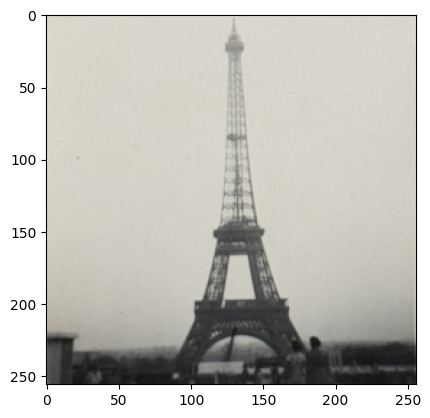

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


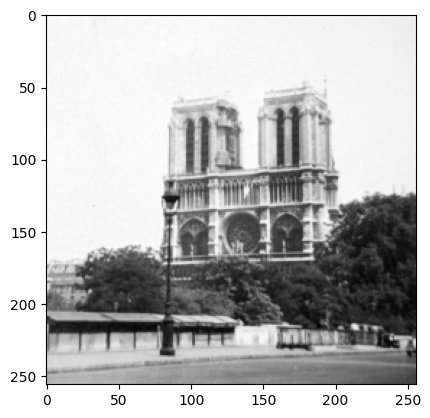

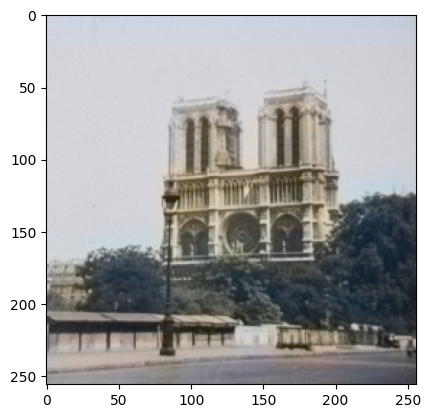

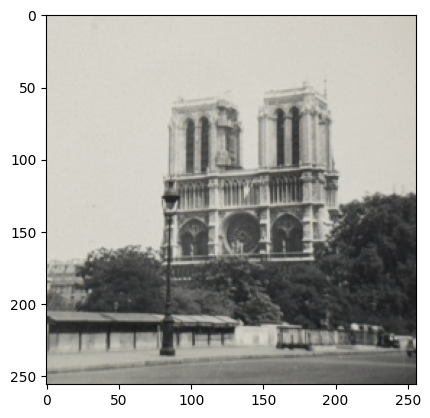

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


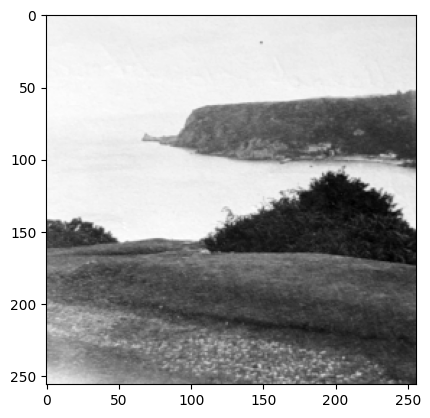

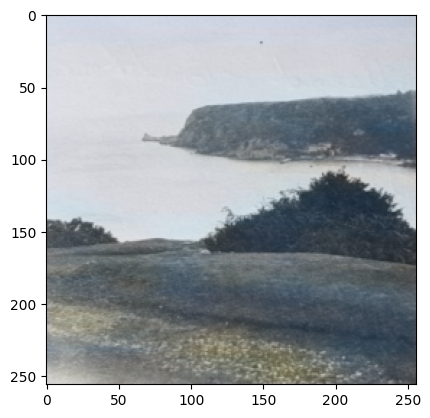

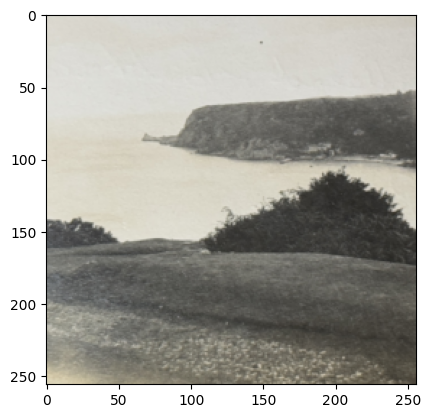

In [17]:
for idx in range(testing_images.shape[0]):
    display_image(autoencoder, idx, l_channel_test, u_channel_test, v_channel_test, l_scaler, u_scaler, v_scaler)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


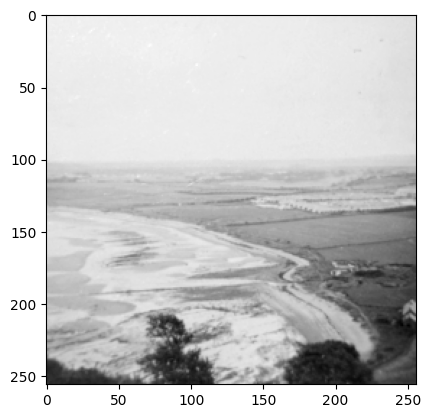

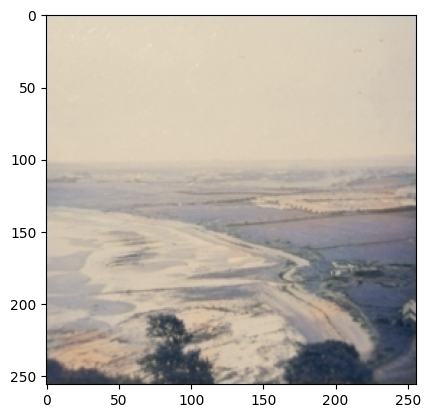

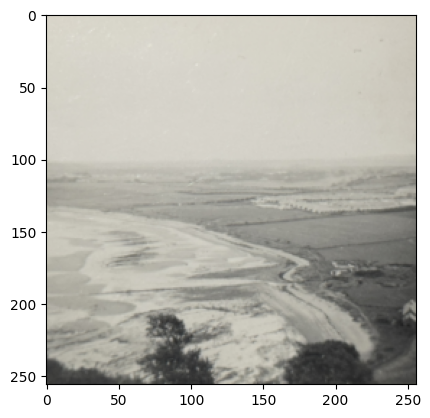

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


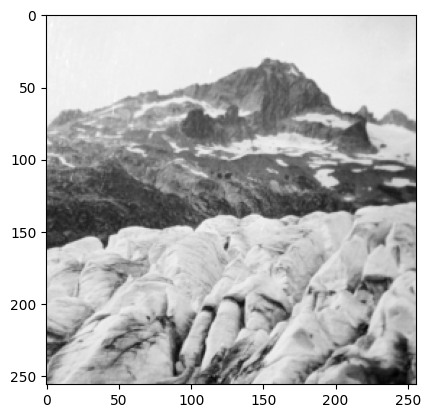

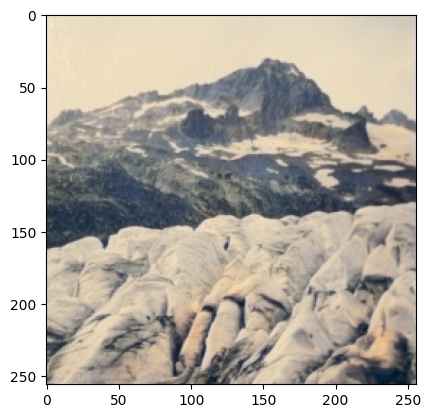

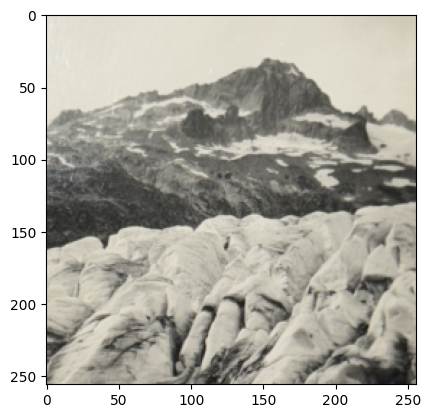

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


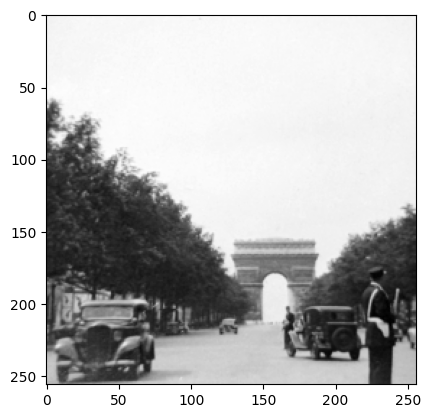

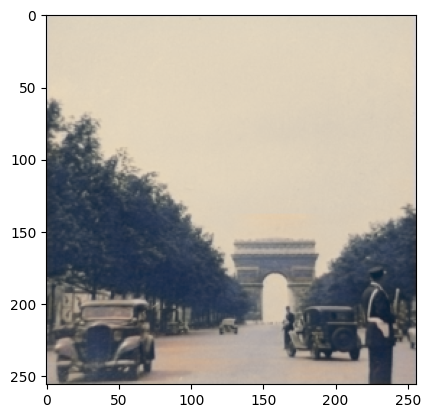

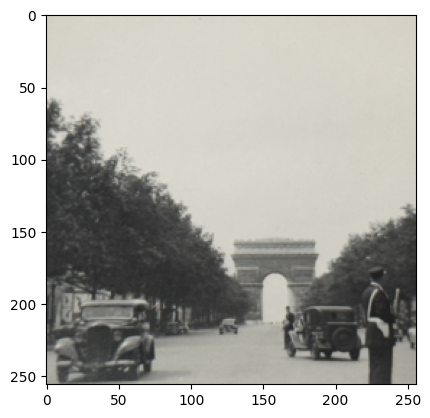

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


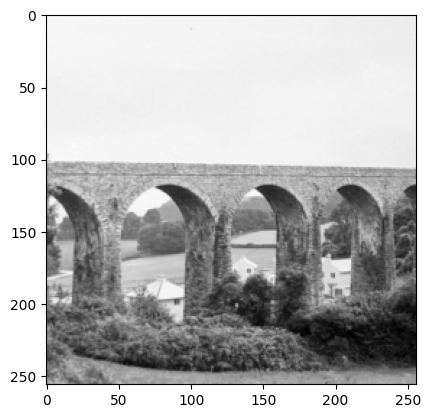

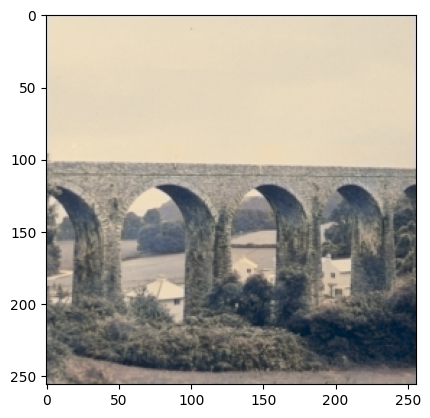

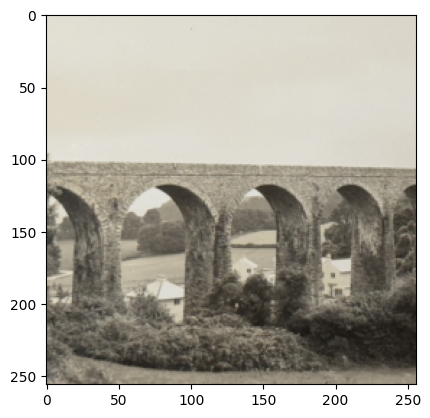

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


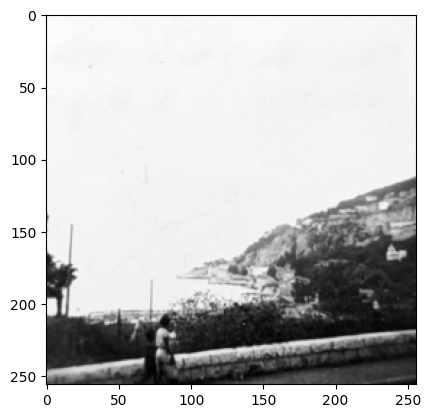

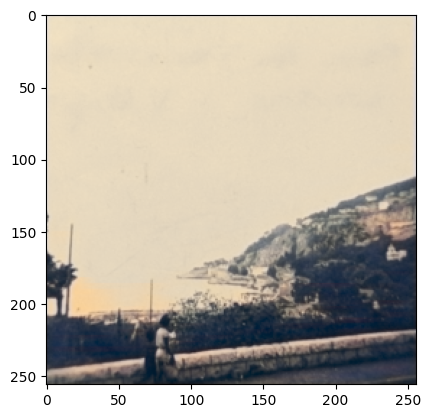

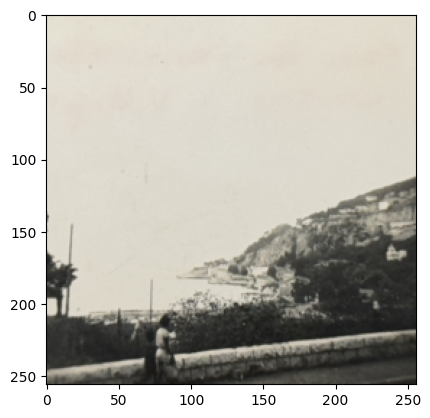

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


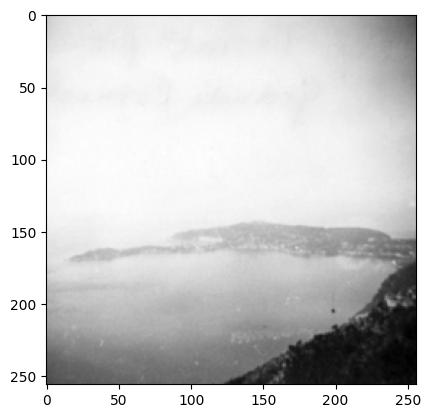

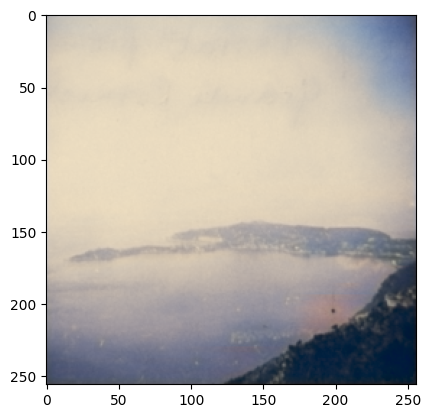

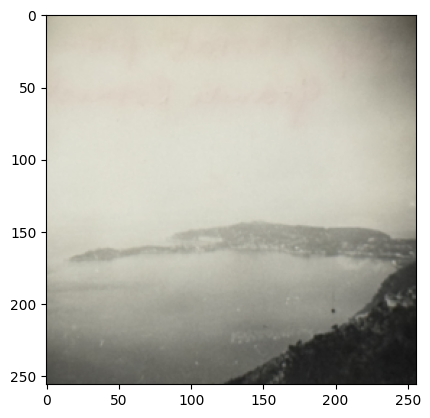

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


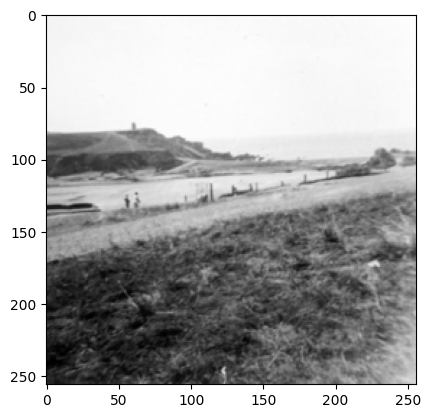

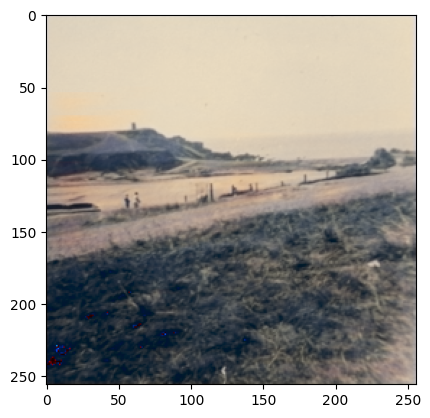

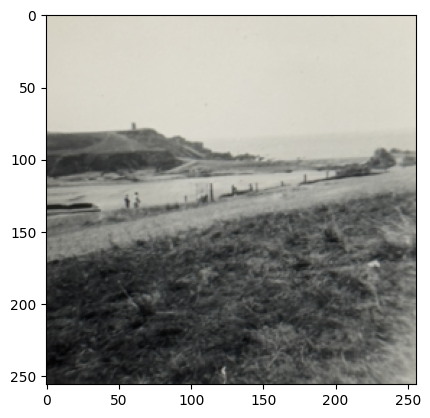

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


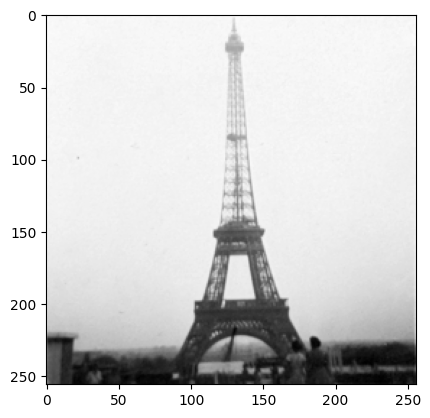

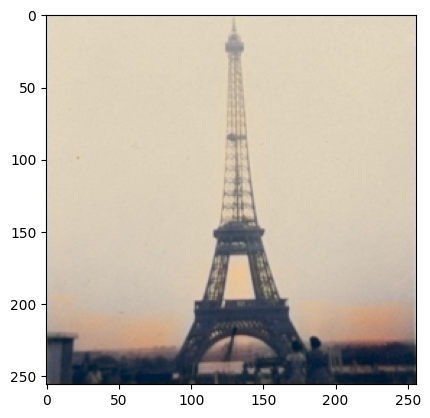

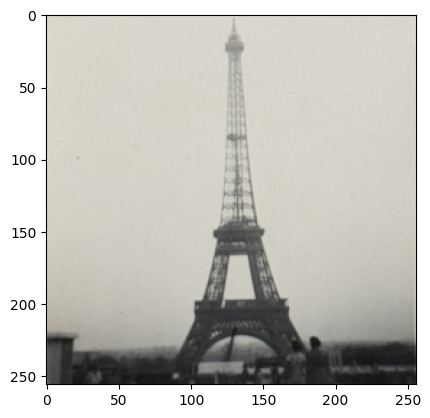

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


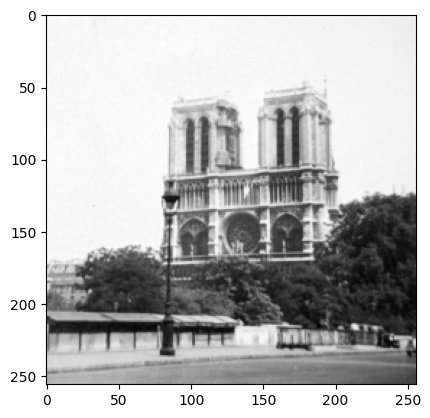

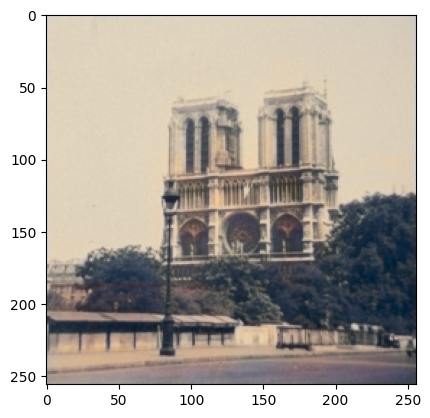

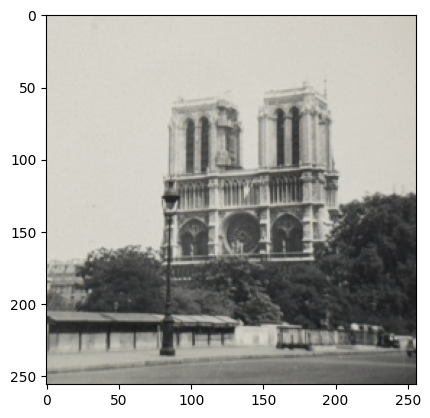

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


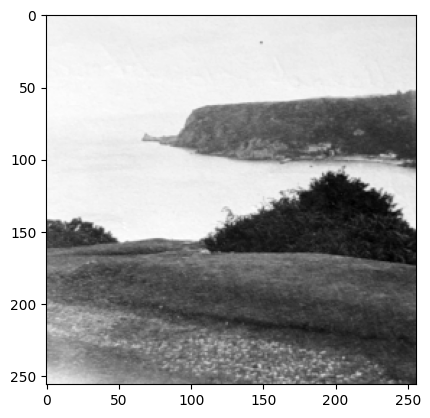

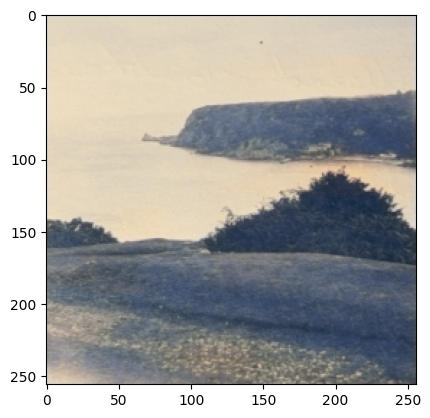

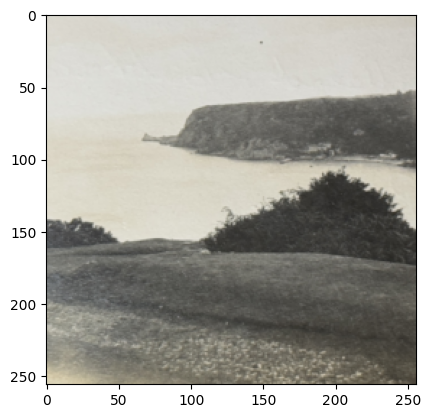

In [20]:
for idx in range(testing_images.shape[0]):
    display_image(unet, idx, l_channel_test, u_channel_test, v_channel_test, l_scaler, u_scaler, v_scaler)

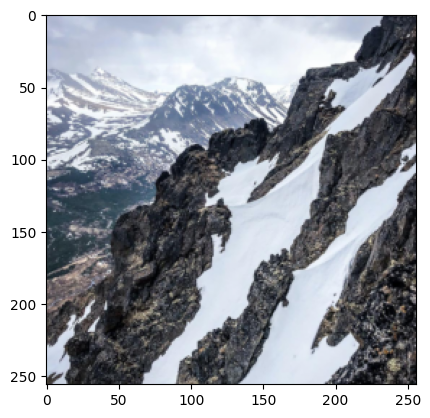

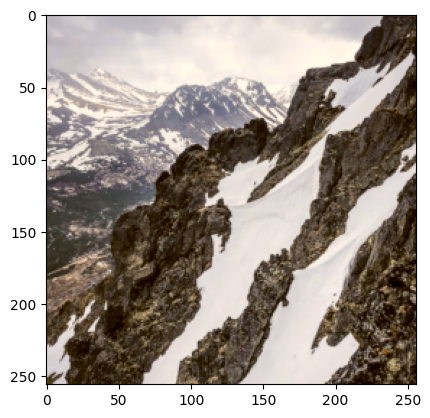

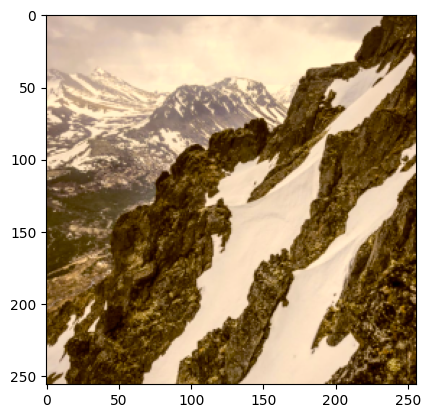

In [42]:
# Check how images look when the U and V channels are changed
# by the amounnts seen in the mean absolute error

image = training_images[0].copy()
plt.imshow(ski.color.luv2rgb(image))
plt.show()
image[:,:,1] = image[:,:,1] + 10
image[:,:,2] = image[:,:,2] + 15
plt.imshow(ski.color.luv2rgb(image))
plt.show()
image[:,:,1] = image[:,:,1] + 13
image[:,:,2] = image[:,:,2] + 20
plt.imshow(ski.color.luv2rgb(image))
plt.show()